# Aerial Image Analytics | Mother Earth
### `Author : Deepika Sharma`                                           `Date : Oct 2020 - Mar 2021`

#### `Folder structure`:
1. Input(train) data ~13,000 images.
2. Annotation : Image labels for each class cloud_shadow, double_plant, planter_skip, standing_water, waterway, weed_cluster are made avaiable under separate folders with labels as 255 where there sis cloud_shadow 0 otherwise, 255 where there is double_palnt 0 otherwise and so on..
3. Test : ~3800 images for testing.

#### `Steps`:
###### Step 1:  Data preparation
For training, each image is converted in to binary image, where 0's represent background and 1,2,3,4,5,6's represent the classes in each image. 



_________________________________________________________________________________________________
Encoding is done as following:

1. Standing water = 1 
2. Double plant = 2
3. Planter skip = 3
4. Weed cluster = 4
5. Standing water = 5
6. Cloud shadow = 6
___________________________________________________________________________________________________

Each annotated image has data encoded using 0(background),1,2,3,4,5,6.


######  Step 2: Model (Keras vgg_unet) training on ~13000 images with n_classes=7 ,  input_height=512, input_width=512. 


###### Step 3: Prediction on ~3800 images
Each predicted image will have image with each pixcel value as either 0/1/2/3/4/5/6.
For better visual representation, these numbers are scaled futher such that output images can have better class distinction.

## Step 1: Data Preparation

### Import libraries

In [1]:
import sys 
import cv2
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


### Scikit learn libraries ### 
from scipy import stats
from skimage.color import rgb2gray
from skimage.feature import blob_dog

# from keras.models import model_from_json


### Pyspark libraries ###
import os,gc
import shutil
import pyspark
import itertools
from operator import add
from pyspark.sql.types import *
from pyspark import SparkContext
from pyspark.sql import DataFrame
from pyspark.sql.functions import udf
from pyspark.ml.image import ImageSchema

size = 512
from keras_segmentation.models.unet import vgg_unet

In [2]:
workdir = os.getcwd()+"\\train\\labels\\"

cloud_shadow = os.listdir(workdir+"\\cloud_shadow") 
double_plant = os.listdir(workdir+"\\double_plant")
planter_skip = os.listdir(workdir+"\\planter_skip")
standing_water = os.listdir(workdir+"\\standing_water")
waterway = os.listdir(workdir+"\\waterway")
weed_cluster = os.listdir(workdir+"\\weed_cluster")

print("#.........................  Data consistency check   ...................................#\n")
print("num of cloud_shadow :", len(cloud_shadow),"     num of double_plant :",len(double_plant),"     num of planter_skip :",len(planter_skip),"     num of standing_water :",len(standing_water),"     num of waterway :",len(waterway),"     num of weed_cluster :",len(weed_cluster),"\n\n")


print("Each class have equal number of images: ", len(cloud_shadow)==len(double_plant)==len(planter_skip)==len(standing_water)==len(waterway)==len(weed_cluster))

#.........................  Data consistency check   ...................................#

num of cloud_shadow : 12901      num of double_plant : 12901      num of planter_skip : 12901      num of standing_water : 12901      num of waterway : 12901      num of weed_cluster : 12901 


Each class have equal number of images:  True


#### Visualisation
Let's visualise the images and respective annotated images

2KIH2Y23Z_4096-7551-4608-8063.jpg


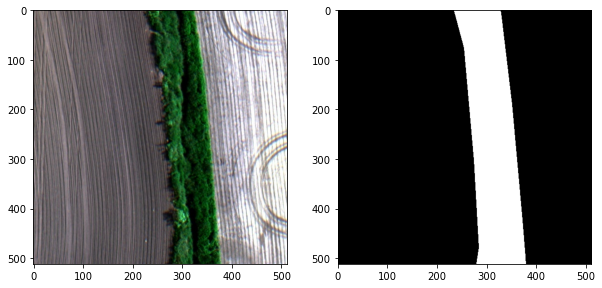

2KIH2Y23Z_4096-8063-4608-8575.jpg


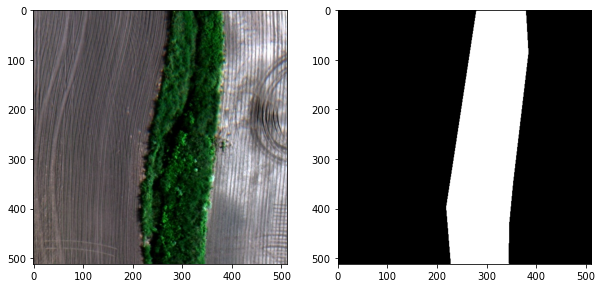

2U827769J_4290-1767-4802-2279.jpg


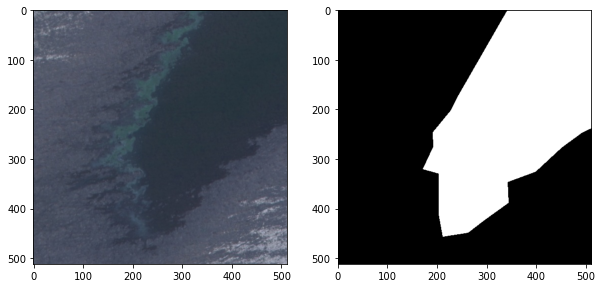

3KYIGUGBQ_3802-861-4314-1373.jpg


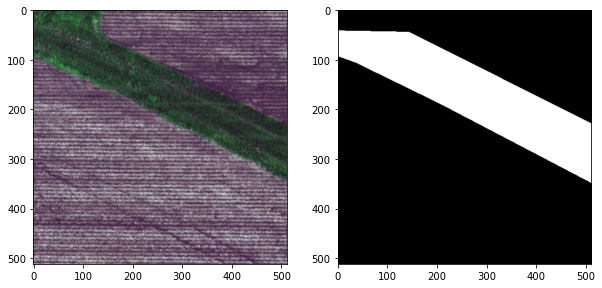

3KYIGUGBQ_4810-8379-5322-8891.jpg


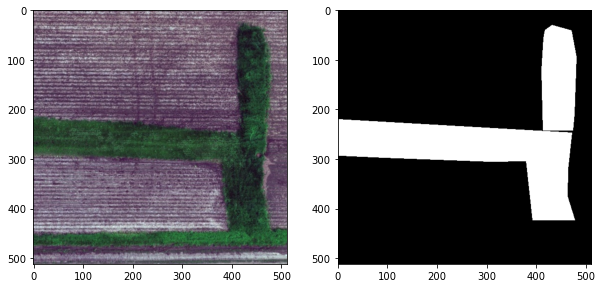

3KYIGUGBQ_5248-5984-5760-6496.jpg


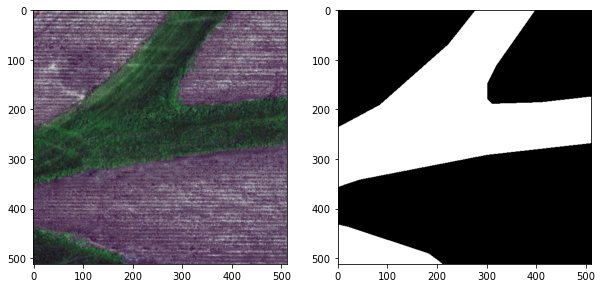

4KTMNU1T3_2278-1019-2790-1531.jpg


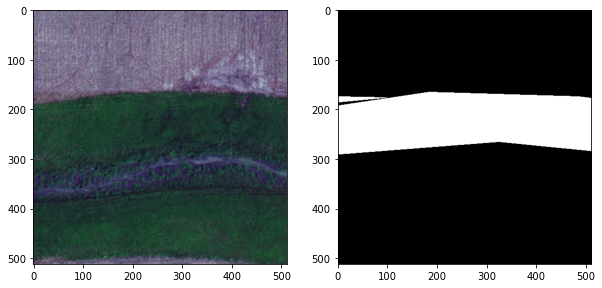

9BGMMWN3K_8573-8285-9085-8797.jpg


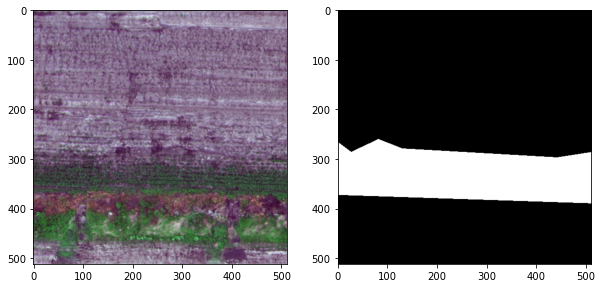

In [3]:
input_dir = "sample_images/"
sample = os.listdir(input_dir)
seq = [2,3,6,8,9,10,11,12]

for i,img_name in enumerate(sample):
    if i in seq:
        image = cv2.imread(input_dir + img_name)
    
        # Get image ids for each image to access the segmentation co-ordinates

        img_name = img_name.split("_seg")[0];print(img_name)
        a = cv2.imread(workdir+"\\cloud_shadow\\"+ img_name.split(".")[0]+".png",0).flatten()
        b = cv2.imread(workdir+"\\double_plant\\"+ img_name.split(".")[0]+".png",0).flatten()
        c = cv2.imread(workdir+"\\standing_water\\"+ img_name.split(".")[0]+".png",0).flatten()
        d = cv2.imread(workdir+"\\waterway\\"+ img_name.split(".")[0]+".png",0).flatten()
        e = cv2.imread(workdir+"\\weed_cluster\\"+ img_name.split(".")[0]+".png",0).flatten()
        
        image_ = a+b+c+d+e
        image_ = np.reshape(image_ , (512,512))


        fig, axes = plt.subplots(1, 2, figsize=(10, 5))#, sharex=True, sharey=True)
        ax = axes.ravel()   
        ax[0].imshow(cv2.cvtColor(image,cv2.COLOR_RGB2BGR))
        ax[1].imshow(cv2.cvtColor(image_,cv2.COLOR_RGB2BGR)) 

        plt.show() 

### Data Preparation part 1

Notes:
1. For data preparation, I am encoding each class with a unique prime number to ensure that each class is uniquely identified
even if they overlap in image.

2. For ex, if classes were encoded as 1,2,3,4,5,6, when summing all the images to create one annotated image for training,
    if 1 and 5 overlapped, there will be entry for 6 (1+5) and actual 6

In [4]:
# if not os.path.exists('train_annotated_part_1'):
#         os.makedirs('train_annotated_part_1')

import input_pre_process # This is IP

for i,val in enumerate(os.listdir(workdir + "\\")):
    # I am removing plater skip as the images avaiable for this category are too less
    # including this class will cause class imbalance.            
            
    out_img = input_pre_process(val)
    out_img = np.reshape(out_img , (im_wtr.shape[0],im_wtr.shape[1]))
    cv2.imwrite("train_annotated_part_1/" + val.split(".")[0]+".png",out_img)

Few more notes:

1. If classes overlapped, the sum of all the classes will not be one among numbers used for encoding, which are set([1,3,5,11,23,53])

2. Let's remove them and encode the classes as 1,2,3,4,5 such that during model training num_of_classes can be input as 6, else model will pick maximum number available in an image as num of classes. 

In [5]:
if not os.path.exists('train_annotated'):
        os.makedirs('train_annotated')
        
        
error_list = []; acceptable_list = set([1,3,5,11,23,53])
for val in os.listdir("train_annotated_part_1"):
    if len(set([np.max(cv2.imread('train_annotated_part_1/'+val))]).intersection(acceptable_list)) > 0:
        temp = cv2.imread('train_annotated_part_1/'+val)
        
        if np.max(temp) == 1:            
            temp = np.where(temp < 1, 0, 1)
        if np.max(temp) == 3:            
            temp = np.where(temp < 3, 0, 2)
        if np.max(temp) == 11:            
            temp = np.where(temp < 11, 0, 3)
        if np.max(temp) == 23:            
            temp = np.where(temp < 23, 0, 4)
        if np.max(temp) == 53:            
            temp = np.where(temp < 53, 0, 5)
        
        cv2.imwrite("train_annotated/" + val.split(".")[0]+".png",temp)   

In [6]:
# subsetting actual input data set for images which qualified the pre-processing conditions

if not os.path.exists('input_train'):
        os.makedirs('input_train')
def image_transfer_(value):
    cv2.imwrite("input_train/" + value.split(".")[0]+".jpg",cv2.imread('input_train_1/'+value.split(".")[0]+".jpg"))
    
input_sample = os.listdir("train_annotated_final")
task = [image_transfer(val) for val in input_sample]

## Step 2.1: Model Training (Single Model for 6 classes)

In [7]:
# This is another method that i tried for training model but the results were not satisfactory..

# https://github.com/qubvel/segmentation_models
# import segmentation_models as sm

# BACKBONE = 'resnet34'
# preprocess_input = sm.get_preprocessing(BACKBONE)

# load your data
# #x_train, y_train, x_val, y_val = load_data(...)

# # preprocess input
# #x_train = preprocess_input(x_train)
# #x_val = preprocess_input(x_val)

# # define model
# model = sm.Unet(BACKBONE, encoder_weights='imagenet')
# model.compile(
#     'Adam',
#     loss=sm.losses.bce_jaccard_loss,
#     metrics=[sm.metrics.iou_score],
# )

# x_train =  "train/"
# y_train = "train_annotated_final/"
# # fit model
# # if you use data generator use model.fit_generator(...) instead of model.fit(...)
# # more about `fit_generator` here: https://keras.io/models/sequential/#fit_generator
# model.fit(
#    x=x_train,
#    y=y_train,
#    batch_size=16,
#    epochs=100,
#    #validation_data=(x_val, y_val),
# )

In [8]:
import keras_segmentation

In [9]:
# import tensorflow.compat.v1 as tensorflow  resnet50
model = vgg_unet(
        n_classes=6, input_height=size, input_width=size)

model.train(
    train_images =  "input_train/", 
    train_annotations = "train_annotated_final/",n_classes = 6,epochs=50,steps_per_epoch=5,
)

Verifying training dataset


100%|████████████████████████████████████████████████████████████████████████████| 12298/12298 [05:26<00:00, 37.71it/s]

Dataset verified! 
Instructions for updating:
Please use Model.fit, which supports generators.


Epoch 1/50
5/5 [==============================] - 52s 10s/step - loss: 2.5207 - accuracy: 0.1286
Epoch 2/50
5/5 [==============================] - 56s 11s/step - loss: 2.3650 - accuracy: 0.1434
Epoch 3/50
5/5 [==============================] - 53s 11s/step - loss: 2.4561 - accuracy: 0.1144
Epoch 4/50
5/5 [==============================] - 53s 11s/step - loss: 2.3403 - accuracy: 0.1924
Epoch 5/50
5/5 [==============================] - 53s 11s/step - loss: 2.4634 - accuracy: 0.1530
Epoch 6/50
5/5 [==============================] - 53s 11s/step - loss: 2.3715 - accuracy: 0.1381
Epoch 7/50
5/5 [==============================] - 53s 11s/step - loss: 2.5019 - accuracy: 0.1301
Epoch 8/50
5/5 [==============================] - 54s 11s/step - loss: 2.3711 - accuracy: 0.1566
Epoch 9/50
5/5 [==============================] - 53s 11s/step - loss: 2.4283 - accuracy: 0.1336
Epoch 10/50
5/5 [==============================] - 53s 11s/step - loss: 2.6378 - accuracy: 0.1217
Epoch 11/50
5/5 [============

In [21]:
import warnings
warnings.simplefilter("ignore")
accuracy = []; submission = {"image_id" : [], "width" : [], "height" : [],"bbox" : [], "Prob":[]}
dir_ = "sample_images/"; output_dir = "segmentation"

for idx,img_name in enumerate(os.listdir(dir_)):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    
    out = model.predict_segmentation(
    inp=dir_+ img_name,
    out_fname= output_dir + "/" + img_name.split(".")[0] + "_seg.png" 
    )  
    
    out_image = cv2.imread(output_dir + "/"+ img_name.split(".")[0] + "_seg.png")
    _image = cv2.imread(dir_+ img_name.split(".")[0] + ".jpg")
    
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))#, sharex=True, sharey=True)
    ax = axes.ravel()
        
    ax[0].imshow(_image)#,cv2.COLOR_RGB2BGR
    ax[1].imshow(out_image)
    
    plt.show()


The accuracy does not seem to look good. Since I have tried training the model with 6 classes using various pre-processing techniques, I will move onto training different model for diffrent class and ensamble the results to see prediction.

### Data Preparation part 2

In [11]:
if not os.path.exists('train_annotated_waterway'):
        os.makedirs('train_annotated_waterway')

if not os.path.exists('train_annotated_cloud_shadow'):
        os.makedirs('train_annotated_cloud_shadow')

        
if not os.path.exists('train_annotated_double_plant'):
        os.makedirs('train_annotated_double_plant')

        
# if not os.path.exists('train_annotated_planter_skip'):
#         os.makedirs('train_annotated_planter_skip')

        
if not os.path.exists('train_annotated_weed_cluster'):
        os.makedirs('train_annotated_weed_cluster')

        
if not os.path.exists('train_annotated_standing_water'):
        os.makedirs('train_annotated_standing_water')

for i,val in enumerate(os.listdir(workdir + "\\waterway\\")):
    
    im_wtr = cv2.imread(workdir+"\waterway\\"+waterway[i],0)
    im_cld = cv2.imread(workdir+"\cloud_shadow\\"+cloud_shadow[i],0)
    im_dplant = cv2.imread(workdir+"\double_plant\\"+double_plant[i],0)
    #im_pltsk = cv2.imread(workdir+"\planter_skip\\"+planter_skip[i],0)
    im_weed = cv2.imread(workdir+"\weed_cluster\\"+weed_cluster[i],0)
    im_stdwtr = cv2.imread(workdir+"\standing_water\\"+standing_water[i],0)
    
    
    l1 = np.where(im_wtr < 255, 0, 1)
    cv2.imwrite("train_annotated_waterway/" + val.split(".")[0]+".png",l1)
    
    l3 = np.where(im_dplant < 255, 0, 1)
    cv2.imwrite("train_annotated_double_plant/" + val.split(".")[0]+".png",l3)
    #l4 = np.where(im_pltsk < 255, 0, 5)#5
    l5 = np.where(im_weed < 255, 0, 1)
    cv2.imwrite("train_annotated_weed_cluster/" + val.split(".")[0]+".png",l5)
    
    l6 = np.where(im_stdwtr < 255, 0, 1)
    cv2.imwrite("train_annotated_standing_water/" + val.split(".")[0]+".png",l6)
    
    l2 = np.where(im_cld < 255, 0, 1)
    cv2.imwrite("train_annotated_cloud_shadow/" + val.split(".")[0]+".png",l2)


### Data Preparation is Done!

## Step 2.2: Model Training , one model for each class

In [12]:
# import tensorflow.compat.v1 as tensorflow  resnet50
size = 512
from keras_segmentation.models.unet import vgg_unet
model_weed = vgg_unet(n_classes=2, input_height=size, input_width=size)
model_weed.train(
    train_images =  "input_train/",
    train_annotations = "train_annotated_weed_cluster/",n_classes = 2,epochs=10,steps_per_epoch=5,
)

Verifying training dataset


100%|████████████████████████████████████████████████████████████████████████████| 12298/12298 [04:29<00:00, 45.59it/s]


Dataset verified! 
Epoch 1/10
5/5 [==============================] - 90s 18s/step - loss: 0.9019 - accuracy: 0.5415
Epoch 2/10
5/5 [==============================] - 91s 18s/step - loss: 0.8835 - accuracy: 0.5530
Epoch 3/10
5/5 [==============================] - 91s 18s/step - loss: 0.8919 - accuracy: 0.5432
Epoch 4/10
5/5 [==============================] - 91s 18s/step - loss: 0.8773 - accuracy: 0.5054
Epoch 5/10
5/5 [==============================] - 91s 18s/step - loss: 0.8803 - accuracy: 0.5112
Epoch 6/10
5/5 [==============================] - 91s 18s/step - loss: 0.8534 - accuracy: 0.5244
Epoch 7/10
5/5 [==============================] - 91s 18s/step - loss: 0.8703 - accuracy: 0.5457
Epoch 8/10
5/5 [==============================] - 91s 18s/step - loss: 0.8614 - accuracy: 0.5479
Epoch 9/10
5/5 [==============================] - 91s 18s/step - loss: 0.9341 - accuracy: 0.4883
Epoch 10/10
5/5 [==============================] - 91s 18s/step - loss: 0.8692 - accuracy: 0.5330


In [13]:
size = 512
from keras_segmentation.models.unet import vgg_unet
model_dbl_plant = vgg_unet(n_classes=2, input_height=size, input_width=size)

model_dbl_plant.train(
    train_images =  "input_train/",
    train_annotations = "train_annotated_double_plant/",n_classes = 2,epochs=10,steps_per_epoch=5,
)

Verifying training dataset


100%|████████████████████████████████████████████████████████████████████████████| 12298/12298 [03:47<00:00, 54.12it/s]


Dataset verified! 
Epoch 1/10
5/5 [==============================] - 91s 18s/step - loss: 1.0632 - accuracy: 0.4125
Epoch 2/10
5/5 [==============================] - 92s 18s/step - loss: 1.0049 - accuracy: 0.4950
Epoch 3/10
5/5 [==============================] - 91s 18s/step - loss: 1.0142 - accuracy: 0.4533
Epoch 4/10
5/5 [==============================] - 92s 18s/step - loss: 1.0503 - accuracy: 0.4535
Epoch 5/10
5/5 [==============================] - 91s 18s/step - loss: 1.0140 - accuracy: 0.4646
Epoch 6/10
5/5 [==============================] - 91s 18s/step - loss: 1.0411 - accuracy: 0.4617
Epoch 7/10
5/5 [==============================] - 91s 18s/step - loss: 1.0542 - accuracy: 0.4320
Epoch 8/10
5/5 [==============================] - 92s 18s/step - loss: 1.0172 - accuracy: 0.4438
Epoch 9/10
5/5 [==============================] - 91s 18s/step - loss: 1.0123 - accuracy: 0.4672
Epoch 10/10
5/5 [==============================] - 91s 18s/step - loss: 0.9869 - accuracy: 0.4772


In [14]:
size = 512
from keras_segmentation.models.unet import vgg_unet
model_cloud = vgg_unet(n_classes=2, input_height=size, input_width=size)

model_cloud.train(
    train_images =  "input_train/",
    train_annotations = "train_annotated_cloud_shadow/",n_classes = 2,epochs=10,steps_per_epoch=5,
)

Verifying training dataset


100%|████████████████████████████████████████████████████████████████████████████| 12298/12298 [03:40<00:00, 55.87it/s]


Dataset verified! 
Epoch 1/10
5/5 [==============================] - 91s 18s/step - loss: 0.9522 - accuracy: 0.5089
Epoch 2/10
5/5 [==============================] - 92s 18s/step - loss: 1.0176 - accuracy: 0.4779
Epoch 3/10
5/5 [==============================] - 91s 18s/step - loss: 1.0096 - accuracy: 0.4836
Epoch 4/10
5/5 [==============================] - 91s 18s/step - loss: 0.9483 - accuracy: 0.4889
Epoch 5/10
5/5 [==============================] - 91s 18s/step - loss: 0.9544 - accuracy: 0.5033
Epoch 6/10
5/5 [==============================] - 91s 18s/step - loss: 0.9216 - accuracy: 0.5011
Epoch 7/10
5/5 [==============================] - 91s 18s/step - loss: 0.9457 - accuracy: 0.4660
Epoch 8/10
5/5 [==============================] - 91s 18s/step - loss: 0.9783 - accuracy: 0.4802
Epoch 9/10
5/5 [==============================] - 91s 18s/step - loss: 0.9600 - accuracy: 0.4624
Epoch 10/10
5/5 [==============================] - 91s 18s/step - loss: 0.9778 - accuracy: 0.5024


In [15]:
size = 512
from keras_segmentation.models.unet import vgg_unet
model_std_water = vgg_unet(n_classes=2, input_height=size, input_width=size)

model_std_water.train(
    train_images =  "input_train/",
    train_annotations = "train_annotated_standing_water/",n_classes = 2,epochs=10,steps_per_epoch=5,
)

Verifying training dataset


100%|████████████████████████████████████████████████████████████████████████████| 12298/12298 [03:48<00:00, 53.85it/s]


Dataset verified! 
Epoch 1/10
5/5 [==============================] - 91s 18s/step - loss: 0.9593 - accuracy: 0.5080
Epoch 2/10
5/5 [==============================] - 91s 18s/step - loss: 0.9933 - accuracy: 0.4783
Epoch 3/10
5/5 [==============================] - 91s 18s/step - loss: 0.9887 - accuracy: 0.5083
Epoch 4/10
5/5 [==============================] - 91s 18s/step - loss: 0.9448 - accuracy: 0.4610
Epoch 5/10
5/5 [==============================] - 91s 18s/step - loss: 0.9630 - accuracy: 0.4899
Epoch 6/10
5/5 [==============================] - 91s 18s/step - loss: 0.9761 - accuracy: 0.4755
Epoch 7/10
5/5 [==============================] - 91s 18s/step - loss: 0.9841 - accuracy: 0.4947
Epoch 8/10
5/5 [==============================] - 91s 18s/step - loss: 0.9689 - accuracy: 0.5135
Epoch 9/10
5/5 [==============================] - 91s 18s/step - loss: 0.9381 - accuracy: 0.4904
Epoch 10/10
5/5 [==============================] - 91s 18s/step - loss: 0.9770 - accuracy: 0.4965


In [16]:
size = 512
from keras_segmentation.models.unet import vgg_unet
model_waterway = vgg_unet(n_classes=2, input_height=size, input_width=size)

model_waterway.train(
    train_images =  "input_train/",
    train_annotations = "train_annotated_waterway/",n_classes = 2,epochs=10 ,steps_per_epoch=2,
)

Verifying training dataset


100%|████████████████████████████████████████████████████████████████████████████| 12298/12298 [04:10<00:00, 49.12it/s]


Dataset verified! 
Epoch 1/10
2/2 [==============================] - 23s 11s/step - loss: 1.0250 - accuracy: 0.4682
Epoch 2/10
2/2 [==============================] - 23s 11s/step - loss: 0.9998 - accuracy: 0.4553
Epoch 3/10
2/2 [==============================] - 23s 11s/step - loss: 0.9072 - accuracy: 0.5149
Epoch 4/10
2/2 [==============================] - 23s 11s/step - loss: 0.9211 - accuracy: 0.4916
Epoch 5/10
2/2 [==============================] - 23s 11s/step - loss: 1.0681 - accuracy: 0.4917
Epoch 6/10
2/2 [==============================] - 23s 11s/step - loss: 1.0496 - accuracy: 0.4609
Epoch 7/10
2/2 [==============================] - 23s 11s/step - loss: 1.0130 - accuracy: 0.4938
Epoch 8/10
2/2 [==============================] - 23s 11s/step - loss: 0.9938 - accuracy: 0.4805
Epoch 9/10
2/2 [==============================] - 23s 11s/step - loss: 0.9978 - accuracy: 0.4729
Epoch 10/10
2/2 [==============================] - 23s 11s/step - loss: 1.1199 - accuracy: 0.4455


## Step 3: Prediction

In [17]:
import warnings
warnings.simplefilter("ignore")
dir_ = "input_train/"; output_dir = "segmentation"

for idx,img_name in enumerate(os.listdir(dir_)):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    out = model.predict_segmentation(
    inp=dir_+ img_name,
    out_fname= output_dir +"/" + img_name.split(".")[0] + "_seg.png" 
    )  
    
    out = model_weed.predict_segmentation(
    inp= dir_+ img_name,
    out_fname= output_dir + "/" + img_name.split(".")[0] + "_weed.png" 
    )  
    
    out = model_dbl_plant.predict_segmentation(
    inp= dir_+ img_name,
    out_fname= output_dir + "/" + img_name.split(".")[0] + "_dbl_plant.png" 
    ) 
    
    out = model_cloud.predict_segmentation(
    inp= dir_+ img_name,
    out_fname= output_dir + "/" + img_name.split(".")[0] + "_cloud.png" 
    ) 
    
    out = model_std_water.predict_segmentation(
    inp= dir_+ img_name,
    out_fname= output_dir + "/" + img_name.split(".")[0] + "_std_water.png" 
    ) 
    
    out = model_waterway.predict_segmentation(
    inp= dir_+ img_name,
    out_fname= output_dir + "/" + img_name.split(".")[0] + "_waterway.png" 
    ) 
    
    cv2.imwrite(output_dir + "/" + img_name.split(".")[0] + ".png" ,cv2.imread(dir_ + img_name))
    
    
    l = ["weed", "waterway", "std_water","dbl_plant","cloud"]


math.floor(waterway_n)

In [18]:
import random
random_list = []; n =300
for i in range(0,n):
    random_list.append(random.randint(0,n))
random_list = list(set(sorted(random_list)))

Predicted class is : dbl_plant ||   Actual class is : waterway
11T3V93AF_3083-3751-3595-4263_seg.png


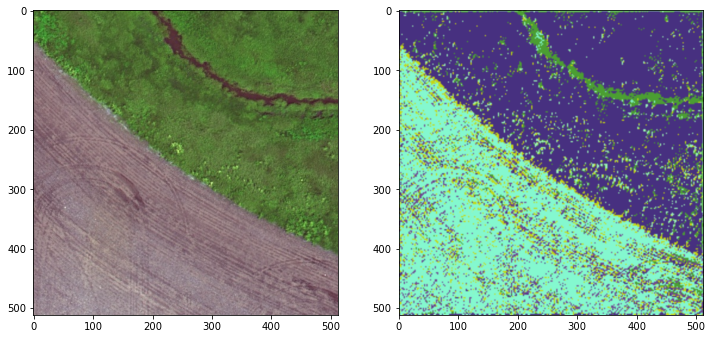

Predicted class is : dbl_plant ||   Actual class is : waterway
11T3V93AF_6217-8232-6729-8744_seg.png


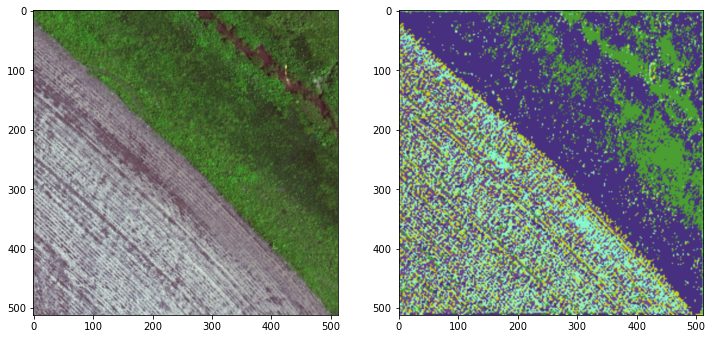

Predicted class is : waterway ||   Actual class is : waterway
11T3V93AF_6485-1239-6997-1751_seg.png


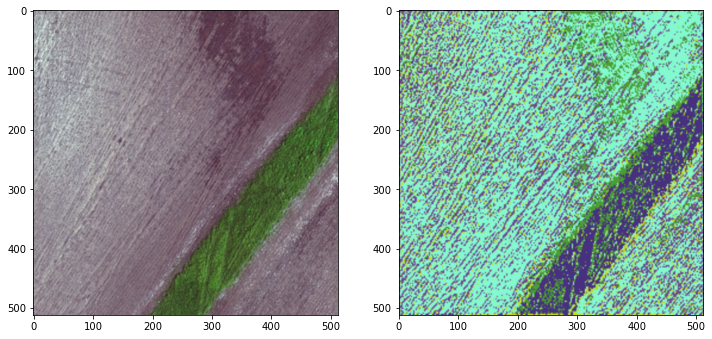

Predicted class is : waterway ||   Actual class is : waterway
11T3V93AF_6485-1751-6997-2263_seg.png


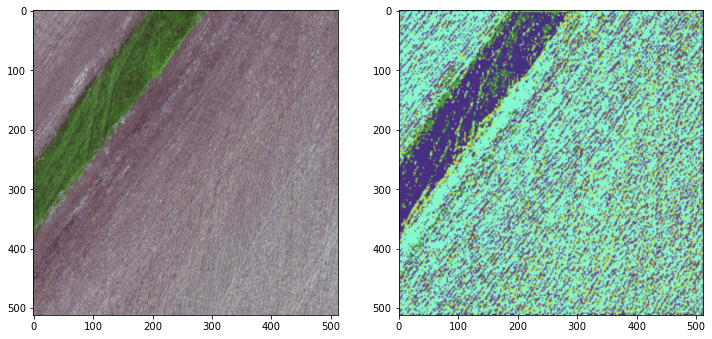

Predicted class is : dbl_plant ||   Actual class is : waterway
11T3V93AF_6583-7912-7095-8424_seg.png


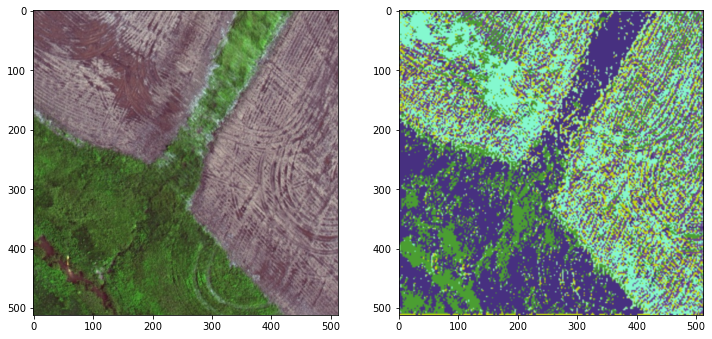

Predicted class is : std_water ||   Actual class is : weed cluster
12GWAPNV1_2664-7480-3176-7992_seg.png


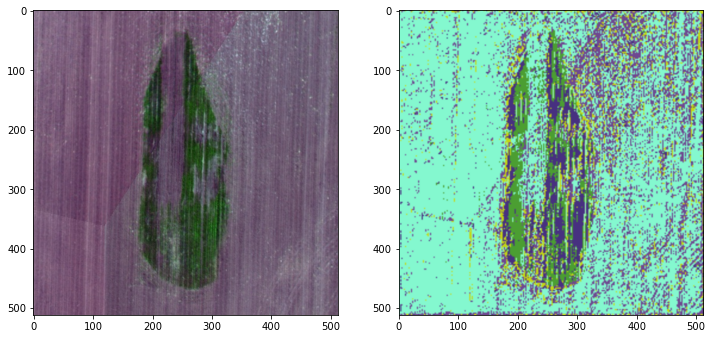

Predicted class is : weed cluster ||   Actual class is : weed cluster
1L7F6F74T_3254-1994-3766-2506_seg.png


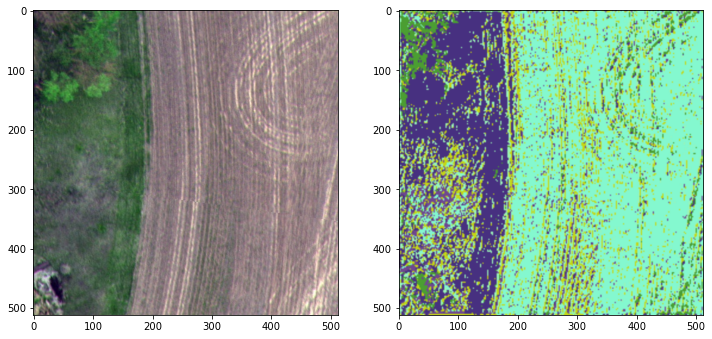

Predicted class is : dbl_plant ||   Actual class is : weed cluster
1W6YEHJJU_1985-8429-2497-8941_seg.png


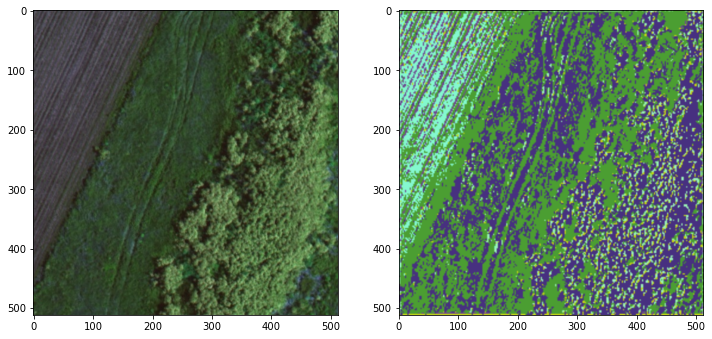

Predicted class is : weed cluster ||   Actual class is : weed cluster
1W6YEHJJU_5227-464-5739-976_seg.png


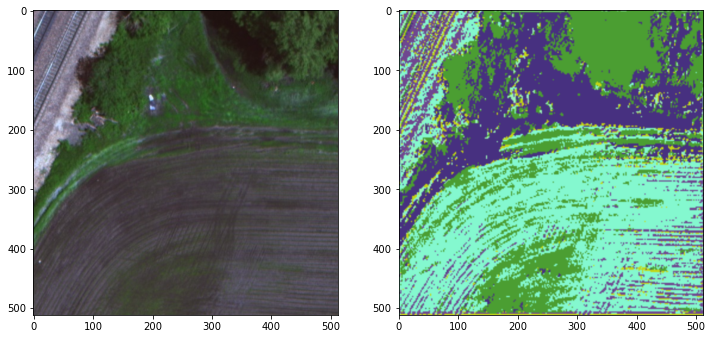

Predicted class is : dbl_plant ||   Actual class is : weed cluster
24M49T6CC_3733-3293-4245-3805_seg.png


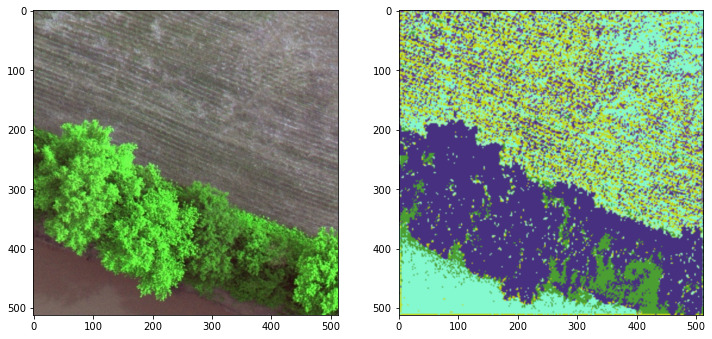

Predicted class is : dbl_plant ||   Actual class is : weed cluster
24M49T6CC_5269-3805-5781-4317_seg.png


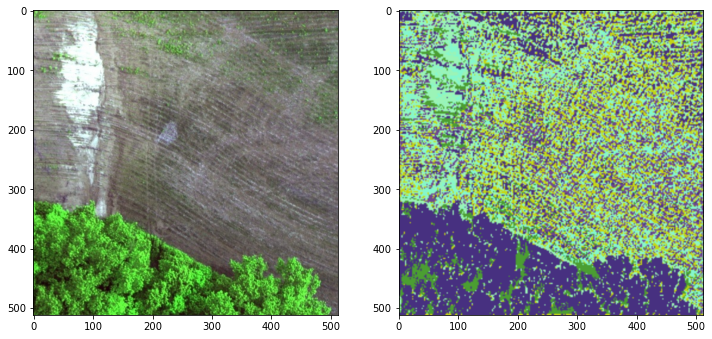

Predicted class is : weed cluster ||   Actual class is : weed cluster
24M49T6CC_722-1111-1234-1623_seg.png


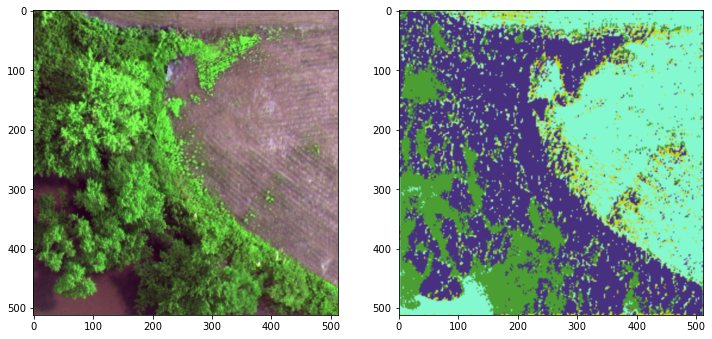

Predicted class is : waterway ||   Actual class is : weed cluster
24M49T6CC_8341-3805-8853-4317_seg.png


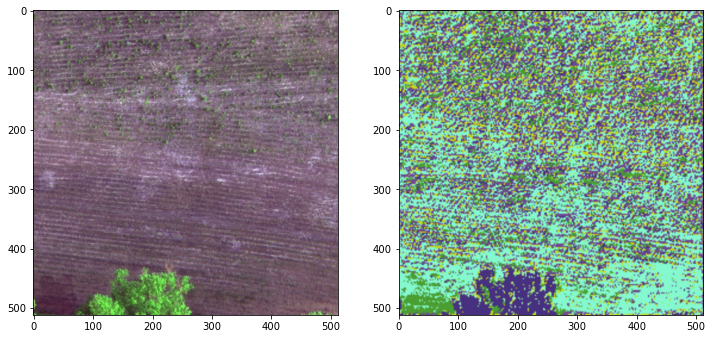

Predicted class is : std_water ||   Actual class is : weed cluster
26DRBUF64_12003-699-12515-1211_seg.png


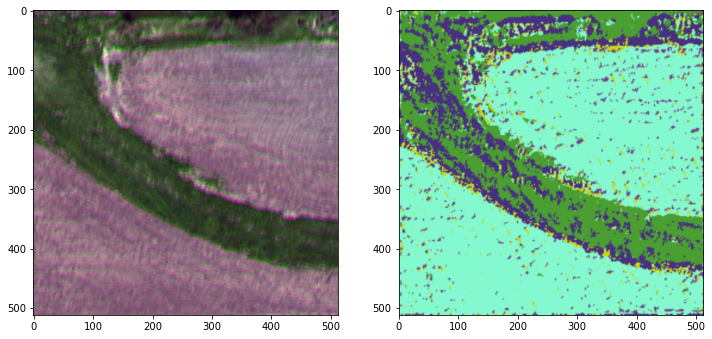

Predicted class is : std_water ||   Actual class is : weed cluster
26DRBUF64_12206-512-12718-1024_seg.png


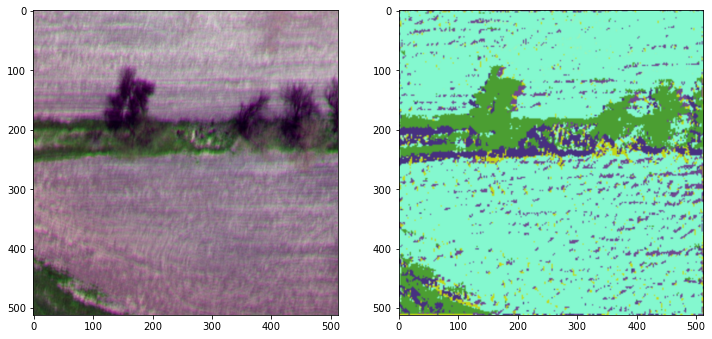

Predicted class is : weed cluster ||   Actual class is : weed cluster
26DRBUF64_2764-1450-3276-1962_seg.png


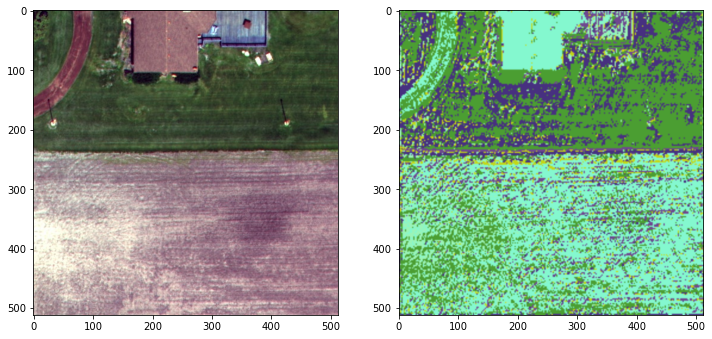

Predicted class is : weed cluster ||   Actual class is : weed cluster
26DRBUF64_621-1173-1133-1685_seg.png


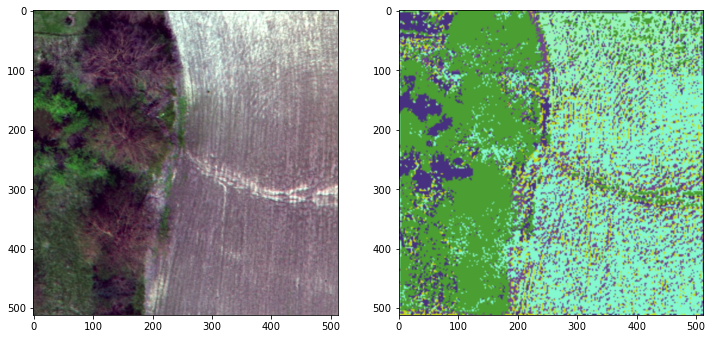

Predicted class is : dbl_plant ||   Actual class is : weed cluster
29PWCB1DI_1134-5128-1646-5640_seg.png


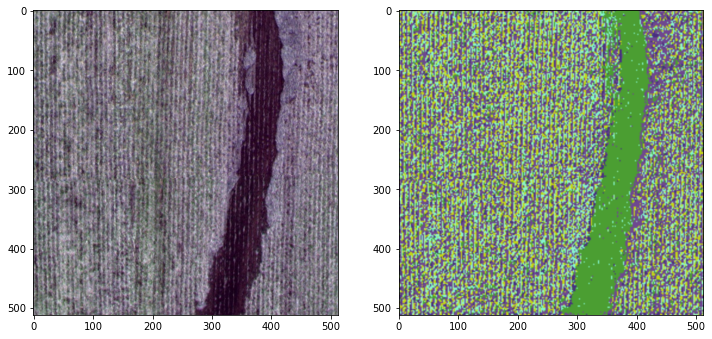

Predicted class is : dbl_plant ||   Actual class is : weed cluster
29PWCB1DI_1145-7570-1657-8082_seg.png


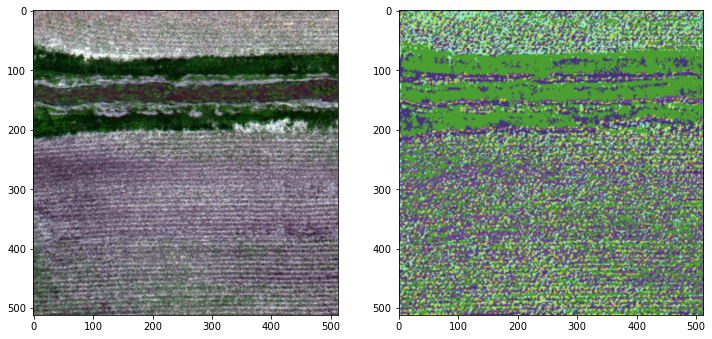

Predicted class is : dbl_plant ||   Actual class is : weed cluster
29PWCB1DI_2887-598-3399-1110_seg.png


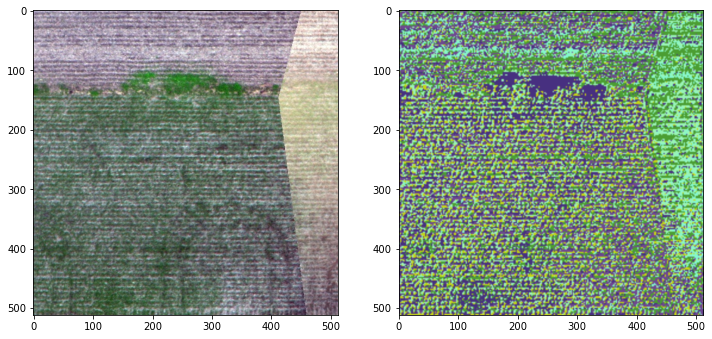

Predicted class is : dbl_plant ||   Actual class is : waterway
29PWCB1DI_2998-7430-3510-7942_seg.png


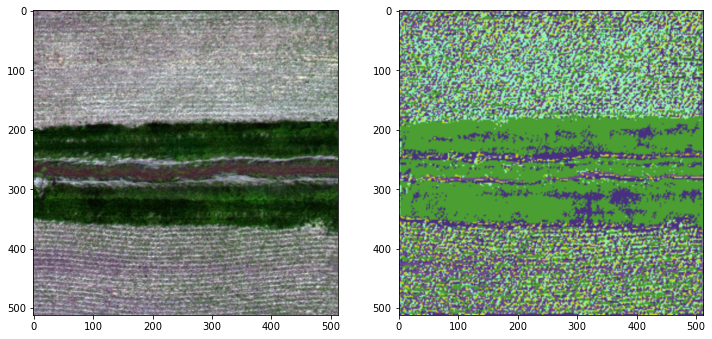

Predicted class is : dbl_plant ||   Actual class is : waterway
29PWCB1DI_3329-7578-3841-8090_seg.png


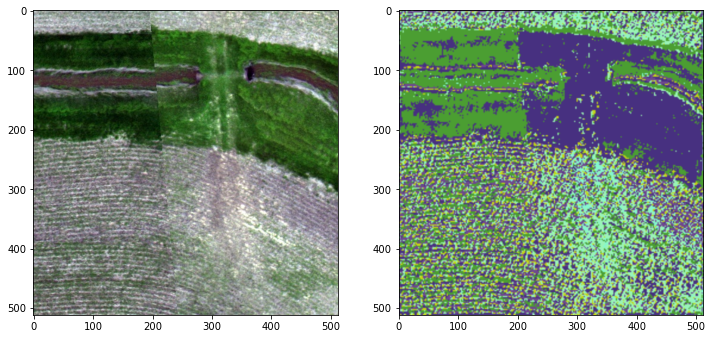

Predicted class is : dbl_plant ||   Actual class is : weed cluster
2CTF1YW2N_10616-2874-11128-3386_seg.png


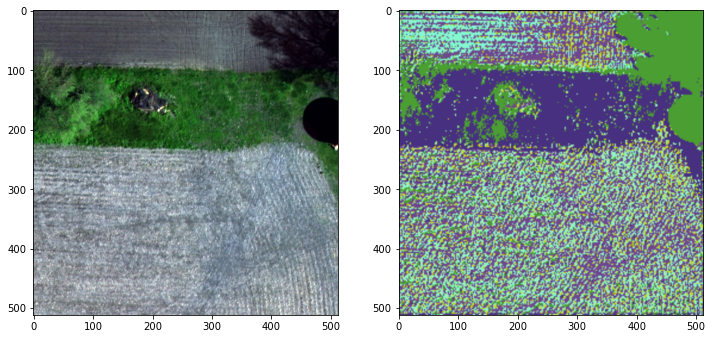

Predicted class is : dbl_plant ||   Actual class is : weed cluster
2CTF1YW2N_7748-2928-8260-3440_seg.png


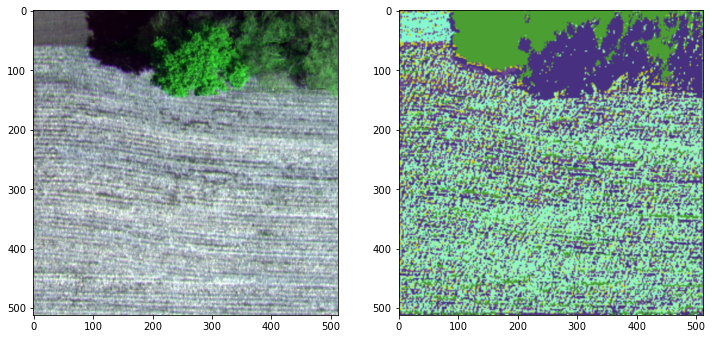

Predicted class is : dbl_plant ||   Actual class is : weed cluster
2CTF1YW2N_8598-2848-9110-3360_seg.png


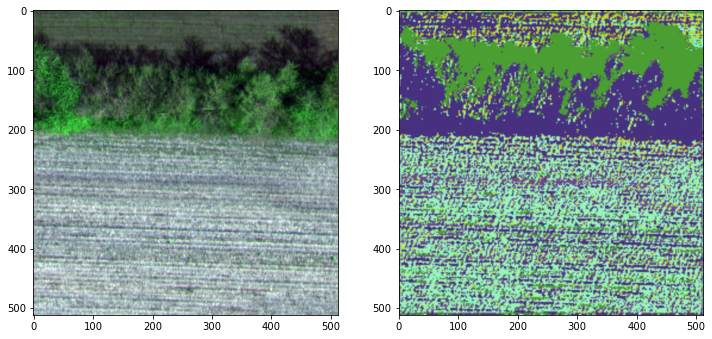

Predicted class is : dbl_plant ||   Actual class is : weed cluster
2CTF1YW2N_9537-2876-10049-3388_seg.png


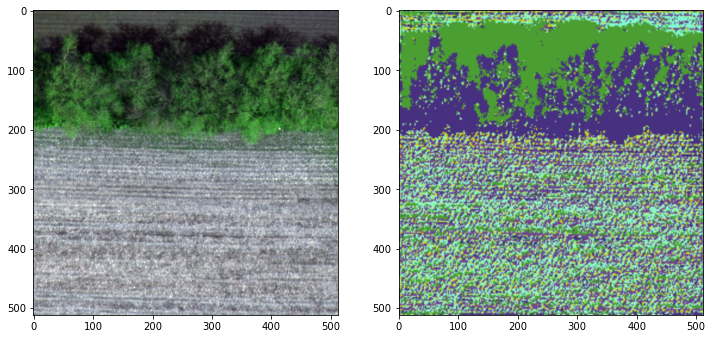

Predicted class is : dbl_plant ||   Actual class is : weed cluster
2FPNYIQY1_1151-416-1663-928_seg.png


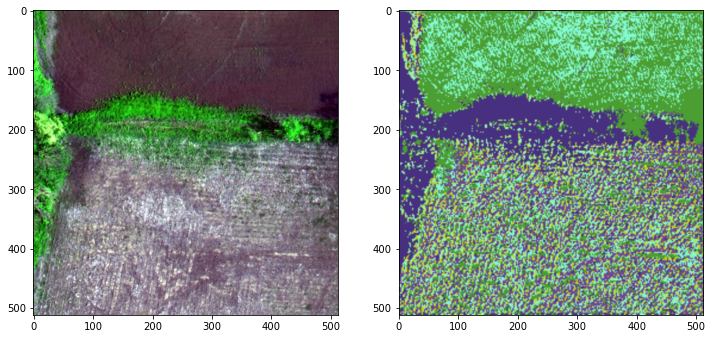

Predicted class is : dbl_plant ||   Actual class is : weed cluster
2FPNYIQY1_1260-950-1772-1462_seg.png


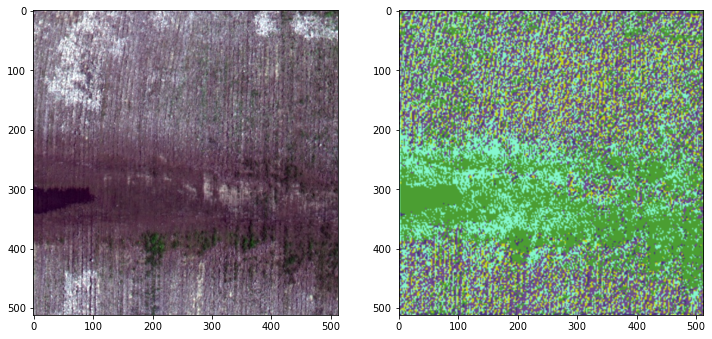

Predicted class is : waterway ||   Actual class is : weed cluster
2FPNYIQY1_3836-554-4348-1066_seg.png


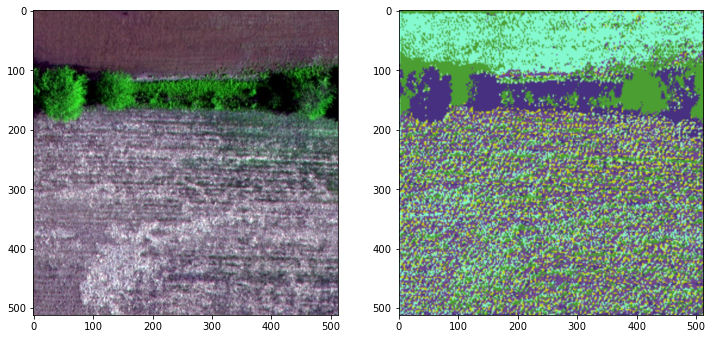

In [19]:
input_dir = "segmentation/"
sample = os.listdir(input_dir)
n_c = 6; count = 0; total = int(len(os.listdir(input_dir))/6)

for i,img_name_sample in enumerate(sample):
    if "_seg" in img_name_sample and i in random_list:
        image = cv2.imread(input_dir + img_name_sample,0)
        
        # Get image ids for each image to access the segmentation co-ordinates
        l_ = ["\\waterway\\","\\double_plant\\","\\weed_cluster\\","\\standing_water\\","\\cloud_shadow\\"]
        
        iteration_val = 15
        a1 = cv2.erode(image,(5,5), iterations = iteration_val)
        a1 = cv2.dilate(a1,(5,5),iterations = iteration_val)
        ret,th3 = cv2.threshold(a1,0,255,cv2.THRESH_OTSU)#;print(ret)
        locs_seg = np.where(th3.flatten() == 255)[0]
        
        if "_seg" in img_name_sample:
            img_name = img_name_sample.split("_seg")[0];#print(img_name)
            a = cv2.imread(workdir+l_[0]+ img_name.split(".")[0]+".png",0).flatten()
            b = cv2.imread(workdir+l_[1]+ img_name.split(".")[0]+".png",0).flatten()
            c = cv2.imread(workdir+l_[2]+ img_name.split(".")[0]+".png",0).flatten()
            d = cv2.imread(workdir+l_[3]+ img_name.split(".")[0]+".png",0).flatten()
            e = cv2.imread(workdir+l_[4]+ img_name.split(".")[0]+".png",0).flatten()
            
            cld_n = 100; std_wat_n = 100; waterway_n = 100; weed_n = 100; dbl_plant_n = 100
            try:
                cld = cv2.imread(input_dir + img_name+"_cloud.png") 
                cld_n = stats.mode((cld.flatten()[locs_seg]/np.max(cld.flatten()[locs_seg]))*n_c)[0]
                std_wat  = cv2.imread(input_dir + img_name+"_std_water.png")  
                std_wat_n = stats.mode((std_wat.flatten()[locs_seg]/np.max(std_wat.flatten()[locs_seg]))*n_c)[0]
                waterway  = cv2.imread(input_dir + img_name+"_waterway.png")  
                waterway_n = stats.mode((waterway.flatten()[locs_seg]/np.max(waterway.flatten()[locs_seg]))*n_c)[0]
                weed  = cv2.imread(input_dir + img_name+"_weed.png") 
                weed_n = stats.mode((weed.flatten()[locs_seg]/np.max(weed.flatten()[locs_seg]))*n_c)[0]
                dbl_plant  = cv2.imread(input_dir + img_name+"_dbl_plant.png")  
                dbl_plant_n = stats.mode((dbl_plant.flatten()[locs_seg]/np.max(dbl_plant.flatten()[locs_seg]))*n_c)[0]
            except:pass
                
            
            ids = [i for i,val in enumerate([len(np.where(a == 255)[0])/a.shape[0],len(np.where(b == 255)[0])/b.shape[0],len(np.where(c == 255)[0])/c.shape[0],
                  len(np.where(d == 255)[0])/d.shape[0], len(np.where(e == 255)[0])/e.shape[0]]) if val > .01]
            
            if len(ids) == 0: ids = [4]    
            vls_ = (image.flatten()[locs_seg]/np.max(image.flatten()[locs_seg]))*n_c

            hist_list = list(np.histogram(image[np.where(image>ret)].flatten())[0])
            list_sorted = sorted(hist_list, reverse = True)
            
            hist_list2 = list(np.histogram(image[np.where(image>ret)].flatten())[1])
            list_sorted2 = sorted(hist_list2, reverse = True)

            
            if (list_sorted[0]-list_sorted[1]) > list_sorted[1]:
                if hist_list.index(list_sorted[0]) > len(hist_list)/2:
                    predicted_class = [0]
                if hist_list.index(list_sorted[0]) < len(hist_list)/2:
                    predicted_class = [3]
            if (list_sorted[0]-list_sorted[1]) < list_sorted[1] and\
                                    abs(np.mean(list_sorted)-np.median(list_sorted)) < min(list_sorted):
                predicted_class = [2,1]
            else:
                predicted_class = [4]
        
            l_1 = ["waterway","dbl_plant","weed","std_water","cloud"]
            l_2 = ["waterway","dbl_plant","weed cluster","std_water","cloud"]

            if len(ids) > 0:
                original = l_[ids[0]]
            else: original = "NULL"
            
            prec = (list_sorted[0]-list_sorted[1])/list_sorted[0]
            if len(predicted_class) > 0:
                if round(list_sorted2[1]) == 214 or (round(list_sorted2[1]) == 215 and prec < .50):
                    pred_class = 0
                    
                if round(list_sorted2[1]) == 215 and prec >= .50:
                    pred_class = 2
                  
                if round(list_sorted2[1]) < 214:
                    pred_class = 1
                    
                if round(list_sorted2[1]) > 215:
                    pred_class = 3
                    
                        
                print("Predicted class is :", l_2[pred_class], "||   Actual class is :", l_2[ids[0]])
            else:
                print(" Predicted class is  " + str(l_2[predicted_class[0]]),"||   Actual class is :", l_2[ids[0]])
                pred_class = predicted_class[0]
            
            predicted_image = img_name_sample.split("_seg")[0]+"_"+l_1[pred_class]+".png"
            
                
            fig, axes = plt.subplots(1, 2, figsize=(12, 6))
            ax = axes.ravel() 
            print(img_name_sample)
            ax[0].imshow(cv2.imread(input_dir + img_name_sample.split("_seg")[0]+".png"))
            ax[1].imshow(cv2.imread(input_dir+img_name_sample))

            plt.show()
            #except:pass

In [20]:
# Note : Waterway and Standing water fall under the same class as they share a lot of common features 
# and so are weed cluster and double plant. I am not too woriied if Waterway is getting predicted as Standing water or viceversa
# similarly predictions for dbl_plant as weed_clster or viceversa is not of my cocern as they do not add to false positives.